In [1]:
import sys
sys.path.insert(0, '../..')
import copy
import numpy as np
from model.base import CovidModel, SimulationParameters, set_parameters, normal_ci
from utils import BasicStatistics, RemovePolicy, Propaganda, setup_city_layout, AddPolicyInfectedRate, confidence_interval, multiple_runs
from model.utils import SocialPolicy

In [2]:
listeners = [
["AddPolicyInfectedRateWindow", SocialPolicy.LOCKDOWN_ELEMENTARY_SCHOOL,0.00025 ,1],
["AddPolicyInfectedRateWindow", SocialPolicy.LOCKDOWN_MIDDLE_SCHOOL, 0.00025 ,1],
["AddPolicyInfectedRateWindow", SocialPolicy.LOCKDOWN_HIGH_SCHOOL, 0.00025 ,1],
["AddPolicyInfectedRateWindow", SocialPolicy.LOCKDOWN_RETAIL,0.00025 ,1],
["AddPolicyInfectedRateWindow", SocialPolicy.LOCKDOWN_FACTORY, 0.00025 ,1],
["AddPolicyInfectedRateWindow", SocialPolicy.LOCKDOWN_OFFICE, 0.00025 ,1],
["RemovePolicyInfectedRateWindow", SocialPolicy.LOCKDOWN_ELEMENTARY_SCHOOL, 0.00025 ,21],
["RemovePolicyInfectedRateWindow", SocialPolicy.LOCKDOWN_MIDDLE_SCHOOL, 0.00025 ,21],
["RemovePolicyInfectedRateWindow", SocialPolicy.LOCKDOWN_HIGH_SCHOOL,0.00025 ,21],
["RemovePolicyInfectedRateWindow", SocialPolicy.LOCKDOWN_RETAIL, 0.00025 ,21],
["RemovePolicyInfectedRateWindow", SocialPolicy.LOCKDOWN_FACTORY, 0.00025 ,21],
["RemovePolicyInfectedRateWindow", SocialPolicy.LOCKDOWN_OFFICE,0.00025 ,21]
]

In [3]:
common_parameters = SimulationParameters(
    mask_user_rate = 0.9, # 0.0,
    mask_efficacy = 0.6, #0.0,
    imune_rate = 0.01,
    initial_infection_rate = 0.01,
    hospitalization_capacity = 0.05,
    latency_period_shape = 3,
    latency_period_scale = 1, 
    incubation_period_shape = 6,
    incubation_period_scale = 1, 
    mild_period_duration_shape = 14,
    mild_period_duration_scale = 1,
    hospitalization_period_duration_shape = 12,
    hospitalization_period_duration_scale = 1,
    symptomatic_isolation_rate = 0.0,
    asymptomatic_contagion_probability = 0.1,
#    asymptomatic_contagion_probability = 0.05,
    risk_tolerance_mean = 0.7,
    risk_tolerance_stdev = 0.2,
    herding_behavior_mean = 0.7,
#    herding_behavior_mean = 0.1,
    herding_behavior_stdev = 0.2,
    allowed_restaurant_capacity = 0.25, #1.0, # valid values: {1.0, 0.50, 0.25}
    spreading_rate = normal_ci(2.41, 3.90, 20)
#    spreading_rate = normal_ci(0.5, 1.5, 20)
)

sc = 10

population_size = 1000
simulation_cycles = 360 # days
seed = 31415
np.random.seed(seed)

params = copy.deepcopy(common_parameters)


By changing the coverage of school and work districts over the home districts we can make the disease spread faster or slower as desired .  
def setup_grid_layout(model, population_size,
        home_grid_height, home_grid_width,work_height,work_width, school_height, school_width):
    

Makes a grid of homogeneous home districts, overlaid by school and work districts.
    

home_grid_height is the number of home districts high the grid is, and
    

home_grid_width is the nmber of home districts wide the grid is
    

school height and work height are how many home districts high a school
    

district and work are respectively, and the same for their length.
    

each begins in grid 0,0 and cover the orignal home district grid.
    

Persons assigned to the home districts are also assigned to the school
    

and work districts that cover them. The parameters determine the amount
    

of leakage across groups of people.  With parameters (10,10,1,1,1,1), you get 100
    

completely separated districts with no leakage.  With parameters (6,6,2,2,3,3), illustrated below, you
    

get a grid where every one is connected to everyone else, but there is a
    

degree of separation.  For example, a person in home district (0,0) can be infected
    

by a person in (5,5) but it would be bridged by three infections, slowing the
    

virus down.  Larger sizes for work and school districts enable faster spread. Fastest
    

spread occurs with parameters (1,1,1,1,1,1) or equivalently (10,10, 10,10,10,10)
    

or any of the same number
    

Since this is just a way to allocate human interactions, no label is needed and
    

the grid need not be saved, for interactions to occur, although this informamtion
    

may be useful for visualizations. 


 


<img src="grids.jpg">

 Without locality, the defaults to multiple_run are :  home_grid_height = 1, home_grid_width = 1,work_height = 1, work_width =1, school_height=1, school_width=1.  


In [4]:
import logging
def setLevel(level):
    logger1 = logging.getLogger()
    logger1.setLevel(level)
params.params['temperature'] = 0
params.params['num_communities'] = 1
seeds = [9675, 7590, 802, 3752, 4216, 394, 7618, 6823, 155, 3025, 8816, 2520, 9015, 5373, 6450, 7800, 1660, 9188, 1483, 2526, 8201, 679, 1291, 6494, 909, 3893, 8248, 2433, 2843, 8253]
setLevel(logging.CRITICAL)
multiple_runs(params,population_size,simulation_cycles,seeds = seeds,fname = "duong10000-1", 
              do_print = True, home_grid_height = 1, home_grid_width = 1, listeners = listeners)

Save these seeds if you want to rerun a scenario
[9675, 7590, 802, 3752, 4216, 394, 7618, 6823, 155, 3025, 8816, 2520, 9015, 5373, 6450, 7800, 1660, 9188, 1483, 2526, 8201, 679, 1291, 6494, 909, 3893, 8248, 2433, 2843, 8253]
family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units

disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.04
disconnects
0.01
disconnects
0.03
disconnects
0.04
disconnects
0.03
disconnects
0.03
disconnects
0.02
disconnects
0.03
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.03
disconnects
0.05
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.03
disconnects
0.03
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.04
disconnects
0.04
disconnects
0.03
disconnects
0.04
disconnects
0.0
disconnects
0.04
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.05
disconnects
0.01
disconnects
0.01
disconne

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.04
disconnects
0.04
disconnects
0.03
disconnects
0.06
disconnects
0.06
disconnects
0.05
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.04
disconnects
0.02
disconnects
0.05
disconnects
0.07
disconnects
0.04
disconnects
0.02
disconnects
0.01
disconnects
0.04
disconnects
0.04
disconnects
0.04
disconnects
0.04
disconnects
0.0
disconnects
0.04
disconnects
0.04
disconnects
0.05
disconnects
0.02
disconnects
0.01
disconnects
0.03
disconnects
0.04
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.04
disconnects
0.05
disconnects
0.0
disconnects
0.01
disconnects
0.04
disconnects
0.06
disconnects
0.02
disconnects
0.04
disconnects
0.0
disconnects
0.04
disconnects
0.01
disconnects
0.04
disconnects
0.02
disconnects
0.03
disconnects
0.04
disconnects
0.01
disconnects
0.03
disconnects
0.03
disconnects
0.04
disconnects
0.02
disconnects
0.07
disconnects
0.01
disconnects
0.03
disconnects
0.03
di

xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.04
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.04
disconnects
0.03
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.04
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disco

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.04
disconnects
0.03
disconnects
0.04
disconnects
0.03
disconnects
0.04
disconnects
0.02
disconnects
0.03
disconnects
0.05
disconnects
0.03
disconnects
0.02
disconnects
0.05
disconnects
0.02
disconnects
0.05
disconnects
0.03
disconnects
0.05
disconnects
0.03
disconnects
0.04
disconnects
0.04
disconnects
0.04
disconnects
0.04
disconnects
0.09
disconnects
0.04
disconnects
0.03
disconnects
0.05
disconnects
0.03
disconnects
0.07
disconnects
0.03
disconnects
0.03
disconnects
0.04
disconnects
0.04
disconnects
0.03
disconnects
0.04
disconnects
0.06
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.04
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.02
disconnects
0.03
disconnects
0.01
disconnects
0.04
disconnects
0.02
disconnects
0.03
disconnects
0.03
disconnects
0.0
disconnects
0.02
disconnects
0.04
disconnects
0.0

family_factory.human_count
1001
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disco

xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

disconnects
0.03
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.04
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.05
disconnects
0.06
disconnects
0.05
disconnects
0.04
disconnects
0.01
disconnects
0.04
disconnects
0.06
disconnects
0.02
disconnects
0.03
disconnects
0.03
disconnects
0.03
disconnects
0.02
disconnects
0.03
disconnects
0.05
disconnects
0.02
disconnects
0.05
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.04
disconnects
0.05
disconnects
0.04
disconnects
0.04
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.04
disconnects
0.01
disconnects
0.03
disconnects
0.04
disconnects
0.03
disconnects
0.03
disconnects
0.03
disconnects
0.01
disconnects
0.05
disconnects
0.0
disconnects
0.04
disconnects
0.03
disconnects
0.01
disconnects
0.04
disconnects
0.03
disconnects
0.05
disconnects
0.01
disconnects
0.03
disconnects
0.04
d

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.06
disconnects
0.02
disconnects
0.04
disconnects
0.03
disconnects
0.02
disconnects
0.05
disconnects
0.06
disconnects
0.04
disconnects
0.02
disconnects
0.04
disconnects
0.08
disconnects
0.03
disconnects
0.05
disconnects
0.03
disconnects
0.03
disconnects
0.02
disconnects
0.06
disconnects
0.03
disconnects
0.04
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.06
disconnects
0.05
disconnects
0.05
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.03
disconnects
0.04
disconnects
0.02
disconnects
0.04
disconnects
0.03
disconnects
0.03
disconnects
0.01
disconnects
0.06
disconnects
0.01
disconnects
0.07
disconnects
0.04
disconnects
0.01
disconnects
0.04
disconnects
0.04
disconnects
0.03
disconnects
0.04
disconnects
0.04
disconnects
0.04
disconnects
0.03
disconnects
0.04
disconnects
0.0
disconnects
0.03
disconnects
0.03
disconnects
0.03
disconnects
0.04
disconnects
0.01
disconnects
0.03
disconnects
0.04
disconnects
0.03
disconnects
0.07
disconnects
0.0

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.04
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.04
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.0
discon

xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

disconnects
0.05
disconnects
0.01
disconnects
0.02
disconnects
0.03
disconnects
0.01
disconnects
0.04
disconnects
0.01
disconnects
0.04
disconnects
0.02
disconnects
0.03
disconnects
0.01
disconnects
0.03
disconnects
0.05
disconnects
0.02
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.04
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.04
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.03
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.04
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.04
disconnects
0.0
disconnects
0.0
disconnects
0.02
dis

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.01
disconnects
0.04
disconnects
0.04
disconnects
0.06
disconnects
0.01
disconnects
0.04
disconnects
0.02
disconnects
0.04
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.04
disconnects
0.01
disconnects
0.02
disconnects
0.04
disconnects
0.03
disconnects
0.0
disconnects
0.04
disconnects
0.03
disconnects
0.03
disconnects
0.04
disconnects
0.02
disconnects
0.07
disconnects
0.05
disconnects
0.04
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.04
disconnects
0.0
disconnects
0.04
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.04
disconnects
0.0
disconnects
0.02
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.03
di

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.0
di

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconne

family_factory.human_count
1002
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects
0.03
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.01
di

xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disco

xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

disconnects
0.01
disconnects
0.04
disconnects
0.07
disconnects
0.02
disconnects
0.01
disconnects
0.03
disconnects
0.03
disconnects
0.03
disconnects
0.03
disconnects
0.05
disconnects
0.04
disconnects
0.05
disconnects
0.06
disconnects
0.03
disconnects
0.04
disconnects
0.03
disconnects
0.04
disconnects
0.03
disconnects
0.03
disconnects
0.03
disconnects
0.04
disconnects
0.03
disconnects
0.04
disconnects
0.03
disconnects
0.03
disconnects
0.04
disconnects
0.0
disconnects
0.04
disconnects
0.03
disconnects
0.03
disconnects
0.03
disconnects
0.02
disconnects
0.03
disconnects
0.03
disconnects
0.03
disconnects
0.08
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.03
disconnects
0.04
disconnects
0.05
disconnects
0.04
disconnects
0.03
disconnects
0.04
disconnects
0.04
disconnects
0.04
disconnects
0.06
disconnects
0.03
disconnects
0.05
disconnects
0.01
disconnects
0.01
disconnects
0.04
disconnects
0.05
disconnects
0.06
disconnects
0.05
disconnects
0.05
disconnects
0.08
disconnects
0.0

xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconne

family_factory.human_count
1002
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disco

xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
di

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.0
disconnects
0.04
disconnects
0.01
disconnects
0.0
disconnects
0.05
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.03
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.03
disconnects
0.01
disconnects
0.04
disconnects
0.03
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects
0.03
disconnects
0.0
disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.03
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.04
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.04
disconnects
0.02
disconnects
0

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.04
disconnects
0.01
disconnects
0.04
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.04
disconnects
0.05
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.0
di

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
discon

family_factory.human_count
1002
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.02
disconnects
0.04
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.04
disconnects
0.02
disconnects
0.03
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.03
disconnects

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects


xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
di

xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Save these seeds if you want to rerun a scenario
[9675, 7590, 802, 3752, 4216, 394, 7618, 6823, 155, 3025, 8816, 2520, 9015, 5373, 6450, 7800, 1660, 9188, 1483, 2526, 8201, 679, 1291, 6494, 909, 3893, 8248, 2433, 2843, 8253]
family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units

disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.05
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.04
disconnects
0.02
disconnects
0.04
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.0
disconnects
0.03
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.03
disconnects
0.03
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.04
disconnects

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.04
disconnects
0.02
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.05
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.03
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.04
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnec

xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.02
disconnects
0.05
disconnects
0.01
disconnects
0.0
disconnects
0.04
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.05
disconnects
0.0
disconnects
0.04
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.04
disconnects
0.0
disconnects
0.05
disconnects
0.0
disconnects
0.03
disconnects
0.04
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.02
disconnects
0.0
disconnects
0.03
disconnec

family_factory.human_count
1001
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.03
disconnects
0.03
disconnects
0.04
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconn

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.04
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.04
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects


xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

disconnects
0.02
disconnects
0.03
disconnects
0.02
disconnects
0.03
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.04
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.04
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.04
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.04
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconne

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



adult 
Work (0) district with 22 Buildings
HomogeneousBuilding: 20 units (each with capacity for 10 people.) 15 allocated units with a total of 55 people.
HomogeneousBuilding: 20 units (each with capacity for 10 people.) 18 allocated units with a total of 72 people.
HomogeneousBuilding: 20 units (each with capacity for 10 people.) 20 allocated units with a total of 72 people.
HomogeneousBuilding: 20 units (each with capacity for 10 people.) 20 allocated units with a total of 68 people.
HomogeneousBuilding: 20 units (each with capacity for 10 people.) 19 allocated units with a total of 55 people.
HomogeneousBuilding: 20 units (each with capacity for 10 people.) 20 allocated units with a total of 72 people.
HomogeneousBuilding: 20 units (each with capacity for 10 people.) 20 allocated units with a total of 75 people.
HomogeneousBuilding: 20 units (each with capacity for 10 people.) 20 allocated units with a total of 65 people.
HomogeneousBuilding: 20 units (each with capacity for 10 peop

disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.0
clumpiness:
[0.048031496062992125, 0.018146577831617203, 0.04828588734100545, 0.018370684433676558, 0.01845548152634767, 0.02807389460932768, 0.018728043609933374, 0.028806783767413687, 0.018643246517262266, 0.05806783767413689, 0.02877044215626893, 0.018461538461538463, 0.018867353119321622, 0.018449424591156876, 0.038310115081768625, 0.00844336765596608, 0.0187038158691702, 0.03834645669291339, 0.008673531193216233, 0.027995154451847366, 0.018219261053906723, 0.008558449424591157, 0.028752271350696548, 0.038316172016959416, 0.008376741368867353, 0.028885523924894005, 0.048413082980012116, 0.018612961841308298, 0.008691701998788612, 0.03844336765596608, 0.008503937007874015, 0.02832222895215021, 0.00860084797092671, 0.02835251362810418, 0.0680557238037553, 0.0483585705632949

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.05
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.04
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.04
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.06
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.02
disconnects
0.04
disconnects
0.02
disconnects
0.04
disconnects
0.02
disconnects
0.04
disconnects
0.02
discon

family_factory.human_count
1002
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.01
disconnects
0.04
disconnects
0.03
disconnects
0.05
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.04
disconnects
0.02
disconnects
0.06
disconnects
0.04
disconnects
0.03
disconnects
0.03
disconnects
0.02
disconnects
0.04
disconnects
0.04
disconnects
0.01
disconnects
0.04
disconnects
0.03
disconnects
0.02
disconnects
0.03
disconnects
0.01
disconnects
0.05
disconnects
0.04
disconnects
0.03
disconnects
0.04
disconnects
0.03
disconnects
0.04
disconnects
0.03
disconnects
0.02
disconnects
0.05
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.04
disconnects
0.03
disconnects
0.03
disconnects
0.03
disconnects
0.05
disconnects
0.05
disconnects
0.01
disconnects
0.04
disconnects
0.0
disconnects
0.05
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.04
disconnects
0.03
disconnects
0.04
disconnects
0.03
disconnects
0.03
disconnects
0.03
disconnects
0.05
disconnects
0.03
disconnects
0.02
disconnects
0.04
disconnects
0.06
disconnects
0.0

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
di

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.06
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.03
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects

family_factory.human_count
1001
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.04
disconnects
0.06
disconnects
0.02
disconnects
0.01
disconnects
0.07
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.03
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.03
disconnects
0.05
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.05
disconnects
0.02
disconnects
0.03
disconnects
0.03
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.02
disconnects
0.05
disconnects
0.0
disconnects
0.03
disconnects
0.01
disc

family_factory.human_count
1002
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.04
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.05
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects
0.03
disconnects
0.03
disconnects
0.0
disconnects
0.03
disconnects
0.04
disconnects
0.04
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.06
disconnects
0.04
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.02
disconnects
0.03
disconnects
0.02
disconnects
0.03
disconnects
0.03
disconnects
0.05
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.04
disconnects
0.01
disconnects
0.04
disconnects
0.04
disconnects
0.02
disc

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.04
disconnects
0.02
disconnects
0.04
disconnects
0.02
disconnects
0.04
disconnects
0.01
disconnects
0.01
disconnects
0.05
disconnects
0.02
disconnects
0.03
disconnects
0.04
disconnects
0.02
disconnects
0.07
disconnects
0.02
disconnects
0.0
disconnects
0.03
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.0
disconnects
0.03
disconnects
0.04
disconnects
0.04
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.03
disconnects
0.03
disconnects
0.0
disconnects
0.06
disconnects
0.03
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.03
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.03
disconnects
0.02
disconnects
0.03
disconnects
0.01
dis

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.0
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.04
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.04
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.04
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.03
disconnects
0.04
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.03
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.04
disconnects
0.04
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disco

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconn

family_factory.human_count
1002
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconne

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.02
disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.04
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.06
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.04
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.04
disconnect

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.03
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0


family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.05
disconnects
0.01
disconnects
0.02
disconnects
0.03
disconnects
0.02
disconnects
0.03
disconnects
0.05
disconnects
0.04
disconnects
0.08
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.03
disconnects
0.03
disconnects
0.01
disconnects
0.03
disconnects
0.04
disconnects
0.04
disconnects
0.05
disconnects
0.04
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.04
disconnects
0.04
disconnects
0.01
disconnects
0.02
disconnects
0.06
disconnects
0.04
dis

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.02
disconnects
0.03
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.04
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.05
disconnects
0.02
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.05
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.04
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnect

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.03
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.03
disconnects
0.05
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
discon

xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.04
disconnects
0.03
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.03
disconnects
0.02
disconnects
0.04
disconnects
0.04
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.0
disconnects
0.04
disconnects
0.06
disconnects
0.04
disconnects
0.02
disconnects
0.01
disconnects
0.03
disconnects
0.03
disconnects
0.03
disconnects
0.04
disconnects
0.03
disconnects
0.02
disconnects
0.02
disconnects
0.02
disconnects
0.05
disconnects
0.05
disconnects
0.03
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.04
disconnects
0.02
disconnects
0.04
disconnects
0.03
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.04
disc

xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconne

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.03
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.06
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.06
disconnects
0.03
disconnects
0.03
disconnects
0.01
disconnects
0.02
disconnects
0.03
disconnects
0.03
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.06
disconnects
0.03
disconnects
0.0
disconnects
0.04
disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconne

using average of time series:
stats on susceptible:
data: [0.8423805555555556, 0.9096027777777778, 0.9026472222222222, 0.8763222222222222, 0.846941946941947, 0.9148194444444445, 0.7950277777777779, 0.8478249999999999, 0.8034944444444443, 0.8696555555555556, 0.9176527777777779, 0.8956694444444445, 0.7927838766910623, 0.8654583333333333, 0.9180333333333336, 0.8919774669774669, 0.8351047904191617, 0.8467805555555555, 0.8913083333333333, 0.9138499999999999, 0.8369055555555556, 0.8845170769571966, 0.8915805555555555, 0.8677861111111111, 0.7905666666666666, 0.8875222222222222, 0.8964138888888888, 0.8955083333333335, 0.862638888888889, 0.8333888888888888]
min:
0.7905666666666666
max:
0.9180333333333336
std:
0.03798869620875116
mean:
0.8674721348958574
median:
0.8729888888888889
95% confidence interval for the mean:
(0.8530444227765964,0.8818998470151184)
using average of time series:
stats on infected:
data: [0.01639444444444444, 0.009230555555555556, 0.010511111111111112, 0.01278611111111111

(<function dict.items>, <function dict.items>, <function dict.items>)

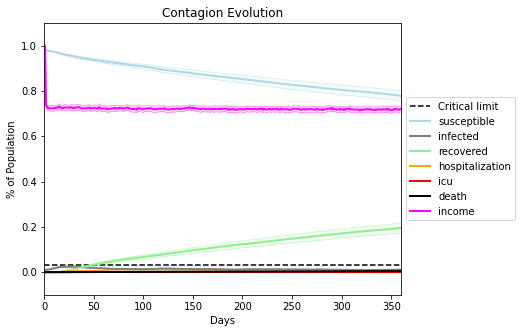

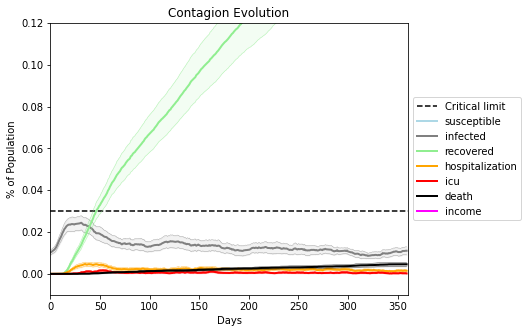

In [5]:
import logging
def setLevel(level):
    logger1 = logging.getLogger()
    logger1.setLevel(level)
params.params['temperature'] = 1
params.params['num_communities'] = 1
seeds = [9675, 7590, 802, 3752, 4216, 394, 7618, 6823, 155, 3025, 8816, 2520, 9015, 5373, 6450, 7800, 1660, 9188, 1483, 2526, 8201, 679, 1291, 6494, 909, 3893, 8248, 2433, 2843, 8253]
setLevel(logging.CRITICAL)
multiple_runs(params,population_size,simulation_cycles,seeds = seeds,fname = "duong10000-1", 
              do_print = True, home_grid_height = 1, home_grid_width = 1, listeners = listeners)

In [ ]:
import logging
def setLevel(level):
    logger1 = logging.getLogger()
    logger1.setLevel(level)
params.params['temperature'] = -1
params.params['num_communities'] = 1
seeds = [9675, 7590, 802, 3752, 4216, 394, 7618, 6823, 155, 3025, 8816, 2520, 9015, 5373, 6450, 7800, 1660, 9188, 1483, 2526, 8201, 679, 1291, 6494, 909, 3893, 8248, 2433, 2843, 8253]
setLevel(logging.CRITICAL)
multiple_runs(params,population_size,simulation_cycles,seeds = seeds,fname = "duong10000-1", 
              do_print = True, home_grid_height = 1, home_grid_width = 1, listeners = listeners)

Save these seeds if you want to rerun a scenario
[9675, 7590, 802, 3752, 4216, 394, 7618, 6823, 155, 3025, 8816, 2520, 9015, 5373, 6450, 7800, 1660, 9188, 1483, 2526, 8201, 679, 1291, 6494, 909, 3893, 8248, 2433, 2843, 8253]
family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units

disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01


xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

disconnects
0.0
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.03
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.03
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
dis

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconne

xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.04
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.04
disconnects
0.03
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.03
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.03
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.03
disconnects
0.03
disconnects
0.01
disconnects
0.0
disconnects
0.04
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.03
disconnects
0.0
disconnects
0.02
disconnects
0.02
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects

family_factory.human_count
1001
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.03
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.0
d

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.04
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
discon

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
dis

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconne

xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.01
disconnects
0.0
disconnects
0.03
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.0
disconnects
0.02
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.0
disconnects
0.01
disconnects
0.0
disconnects
0.01
disconnects
0.01
disconnects
0.02
disconnects
0.02
disconnects
0.0
disconnects
0.01
disconnects
0.02
disconnects
0.0
disconnects
0.02
disconnects
0.03
disconnects
0.0
disco

family_factory.human_count
1000
xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a

disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconnects
0.0
disconne

xfactor
1
yfactor
1
grid_width
1
grid_height
1
blob_grid_pos
(0, 0)
district

Home (0,0) district with 20 Buildings
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousBuilding: 20 units (each with capacity for 5 people.) 0 allocated units with a total of 0 people.
HomogeneousB

In [ ]:
import logging
def setLevel(level):
    logger1 = logging.getLogger()
    logger1.setLevel(level)
params.params['temperature'] = -1
params.params['num_communities'] = 20
seeds = [9675, 7590, 802, 3752, 4216, 394, 7618, 6823, 155, 3025, 8816, 2520, 9015, 5373, 6450, 7800, 1660, 9188, 1483, 2526, 8201, 679, 1291, 6494, 909, 3893, 8248, 2433, 2843, 8253]
setLevel(logging.CRITICAL)
multiple_runs(params,population_size,simulation_cycles,seeds = seeds,fname = "duong10000-1", 
              do_print = True, home_grid_height = 3, home_grid_width = 4, listeners = listeners)

In [ ]:
import logging
def setLevel(level):
    logger1 = logging.getLogger()
    logger1.setLevel(level)
params.params['temperature'] = 0
params.params['num_communities'] = 20
seeds = [9675, 7590, 802, 3752, 4216, 394, 7618, 6823, 155, 3025, 8816, 2520, 9015, 5373, 6450, 7800, 1660, 9188, 1483, 2526, 8201, 679, 1291, 6494, 909, 3893, 8248, 2433, 2843, 8253]
setLevel(logging.CRITICAL)
multiple_runs(params,population_size,simulation_cycles,seeds = seeds,fname = "duong10000-1", 
              do_print = True, home_grid_height = 3, home_grid_width = 4, listeners = listeners)

In [ ]:
import logging
def setLevel(level):
    logger1 = logging.getLogger()
    logger1.setLevel(level)
params.params['temperature'] = 1
params.params['num_communities'] = 20
seeds = [9675, 7590, 802, 3752, 4216, 394, 7618, 6823, 155, 3025, 8816, 2520, 9015, 5373, 6450, 7800, 1660, 9188, 1483, 2526, 8201, 679, 1291, 6494, 909, 3893, 8248, 2433, 2843, 8253]
setLevel(logging.CRITICAL)
multiple_runs(params,population_size,simulation_cycles,seeds = seeds,fname = "duong10000-1", 
              do_print = True, home_grid_height = 3, home_grid_width = 4, listeners = listeners)

 Locality slows down the spread, with parameters home_grid_height = 6, home_grid_width = 6,
                  work_height = 2, work_width =2, school_height=3, school_width=3

In [ ]:
import logging
def setLevel(level):
    logger1 = logging.getLogger()
    logger1.setLevel(level)


setLevel(logging.CRITICAL)
seeds =[9675, 7590, 802, 3752, 4216, 394, 7618, 6823, 155, 3025, 8816, 2520, 9015, 5373, 6450, 7800, 1660, 9188, 1483, 2526, 8201, 679, 1291, 6494, 909, 3893, 8248, 2433, 2843, 8253]
multiple_runs(params,population_size,simulation_cycles,seeds = seeds,fname = "duong10000--7-2", do_print = True, 
              listeners = listeners, home_grid_height = 6, home_grid_width = 6,
                  work_height = 2, work_width =2, school_height=3, school_width=3)

In [ ]:
import logging
def setLevel(level):
    logger1 = logging.getLogger()
    logger1.setLevel(level)


setLevel(logging.CRITICAL)
seeds = [9675, 7590, 802, 3752, 4216, 394, 7618, 6823, 155, 3025, 8816, 2520, 9015, 5373, 6450, 7800, 1660, 9188, 1483, 2526, 8201, 679, 1291, 6494, 909, 3893, 8248, 2433, 2843, 8253]
multiple_runs(params,population_size,simulation_cycles,seeds = seeds,fname = "duong2", do_print = True, 
              listeners = listeners, home_grid_height = 4, home_grid_width = 4,
                  work_height = 1, work_width =2, school_height=2, school_width=1)

In [ ]:
import logging
def setLevel(level):
    logger1 = logging.getLogger()
    logger1.setLevel(level)


setLevel(logging.CRITICAL)
seeds = [9675, 7590, 802, 3752, 4216, 394, 7618, 6823, 155, 3025, 8816, 2520, 9015, 5373, 6450, 7800, 1660, 9188, 1483, 2526, 8201, 679, 1291, 6494, 909, 3893, 8248, 2433, 2843, 8253]
multiple_runs(params,population_size,simulation_cycles,seeds = seeds,fname = "duong4", do_print = True, 
              listeners = listeners, home_grid_height = 6, home_grid_width = 6,
                  work_height = 2, work_width =1, school_height=1, school_width=2)